In [243]:
# Importing Traditional Libraries
import pandas as pd  
import numpy as np 

# Data Exploration
import pandas_profiling as pp 

# Data Visualization
import matplotlib.pyplot as plt 
import seaborn as sns 

# Model Selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Machine Learning Models
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

# Normality Test
from scipy.stats import normaltest

# T TEST
from scipy.stats import ttest_ind_from_stats

In [3]:
df = pd.read_csv("CarPrice_Assignment.csv")
df.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


<h1>Data Exploration</h1>

<h5>Generate a General Report Using Pandas Profiling</h5>

In [4]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/39 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

In [4]:
print(f"Number of Duplicated Rows:\n{df.duplicated().sum()}")
print("\n")
print(f"Missing Values for Each Column:\n{df.isna().sum()}")

Number of Duplicated Rows:
0


Missing Values for Each Column:
car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64


In [60]:
df.describe()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,103.000000,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,59.322565,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,1.000000,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,52.000000,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,103.000000,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,154.000000,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,205.000000,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


<AxesSubplot:>

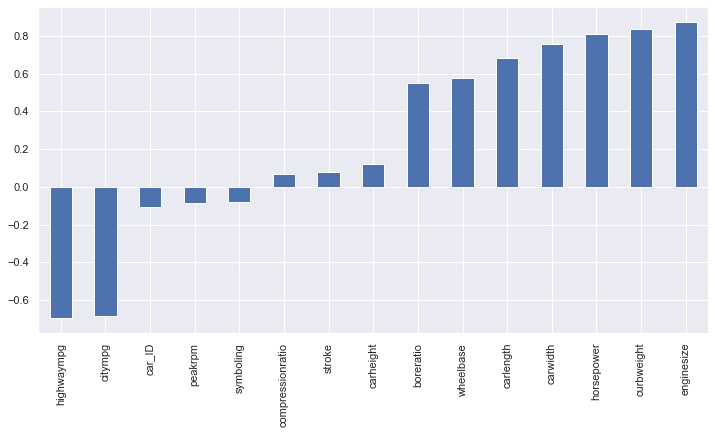

In [5]:
sns.set_theme()
df.corr()["price"].sort_values()[:-1].plot(kind="bar", figsize=(12,6))

<AxesSubplot:>

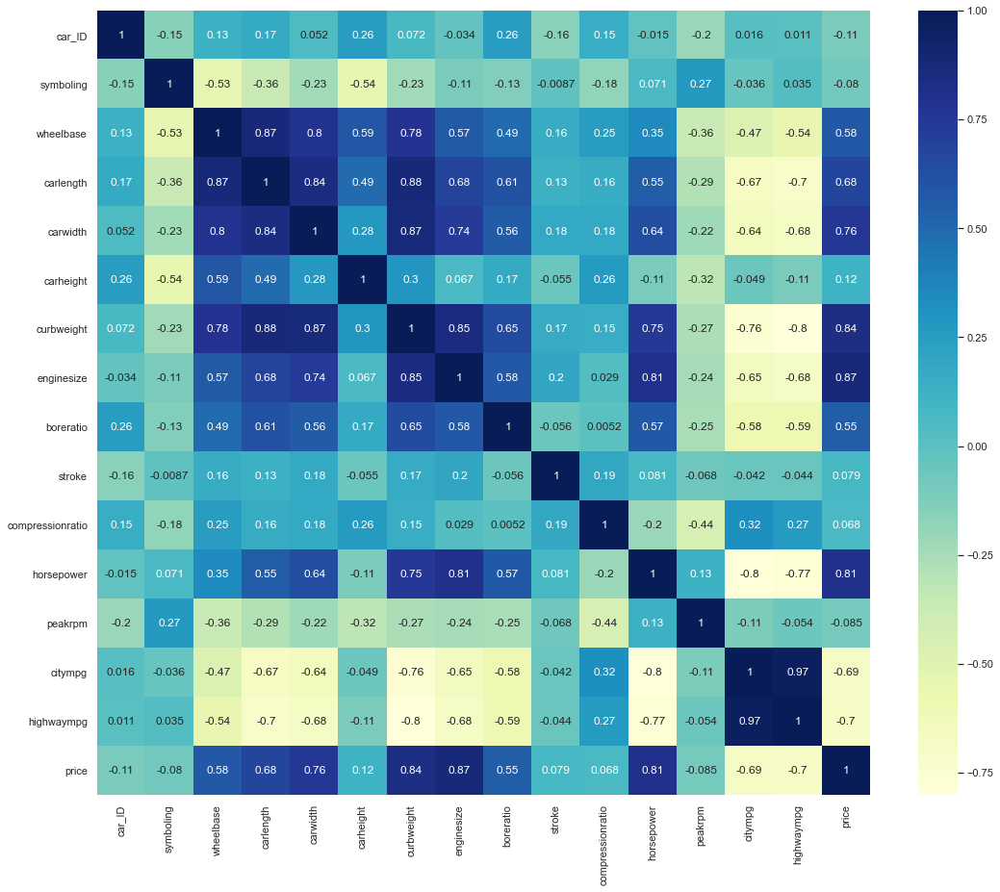

In [6]:
plt.figure(figsize=(18, 15))
sns.heatmap(data=df.corr(), annot=True, cmap="YlGnBu")

<h1>Data Visulization</h1>

In [7]:
df.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


<AxesSubplot:xlabel='price', ylabel='Count'>

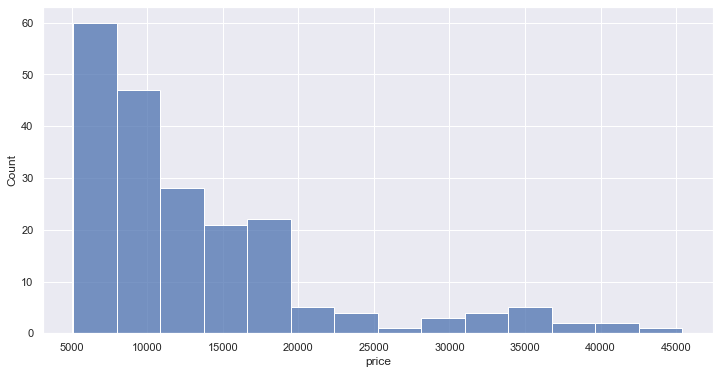

In [9]:
plt.figure(figsize=(12,6))
sns.histplot(data=df, x="price")
# The number of expensive cars in our dataset is small. We should keep this in 
# mind for Feature Engineering Section. 

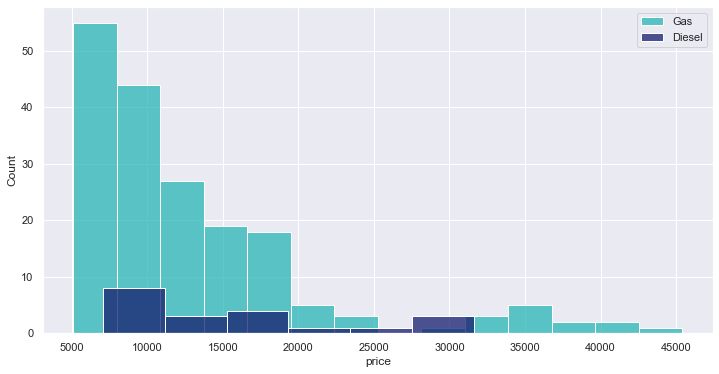

In [30]:
plt.figure(figsize=(12,6))
sns.histplot(data=df[df["fueltype"]=="gas"], x="price", color="#28b5b5")
sns.histplot(data=df[df["fueltype"]=="diesel"], x="price", color="#161d6f")
plt.legend(["Gas", "Diesel"])

<AxesSubplot:xlabel='enginelocation', ylabel='price'>

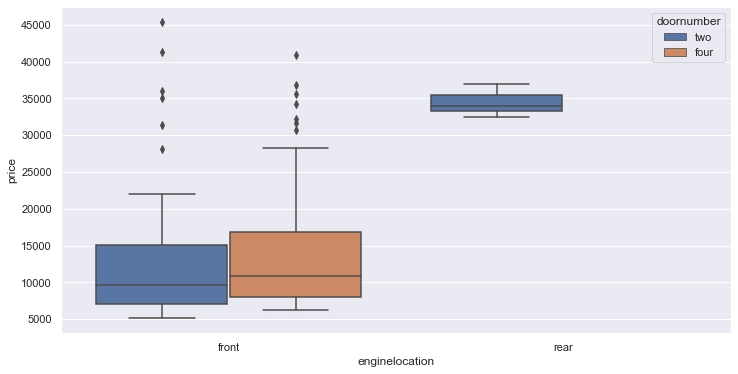

In [59]:
plt.figure(figsize=(12,6))
sns.boxplot(x=df["enginelocation"], y=df["price"], hue=df["doornumber"])
# It seems like 2 door cars with rear engine location are more expensive. The reason might be that 
# they are sport cars.

In [264]:
engine_loc_grouped = df.groupby("enginelocation").mean().transpose().iloc[2:].apply(lambda x: round(x, 2))
engine_loc_grouped

enginelocation,front,rear
carwidth,65.92,65.00
carheight,53.76,51.60
curbweight,2552.37,2770.67
enginesize,125.91,194.00
boreratio,3.32,3.74
stroke,3.26,2.90
compressionratio,10.15,9.50
horsepower,102.59,207.00
peakrpm,5113.61,5900.00
citympg,25.34,17.00


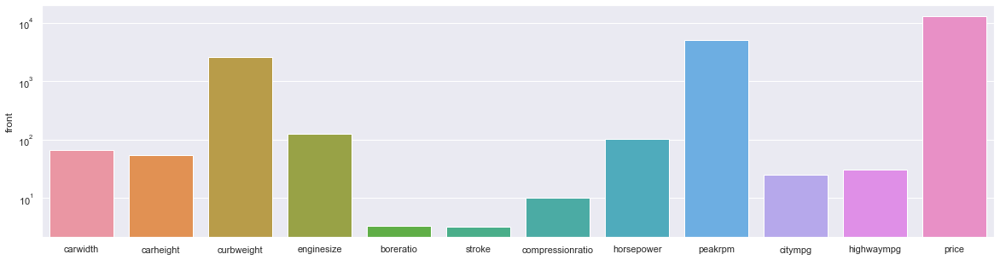

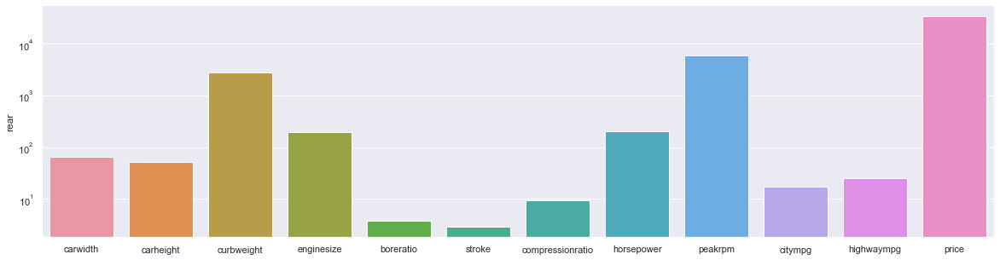

In [265]:
plt.figure(figsize=(20,5))
sns.barplot(data=engine_loc_grouped, y="front", x=engine_loc_grouped.index)
plt.yscale("log")

plt.figure(figsize=(20,5))
sns.barplot(data=engine_loc_grouped, y="rear", x=engine_loc_grouped.index)
plt.yscale("log")


In [271]:
carbody_grouped = df.groupby("carbody").mean().transpose().iloc[2:]

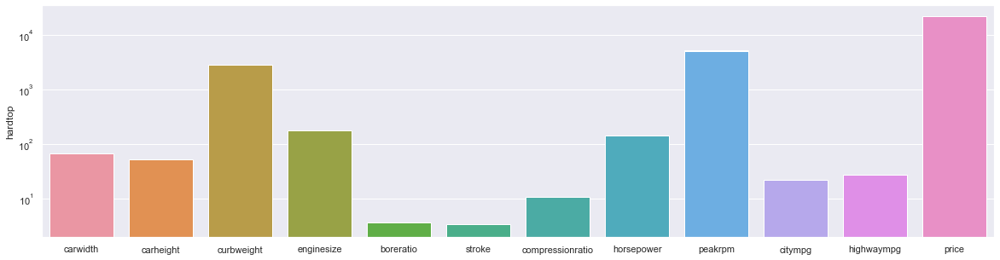

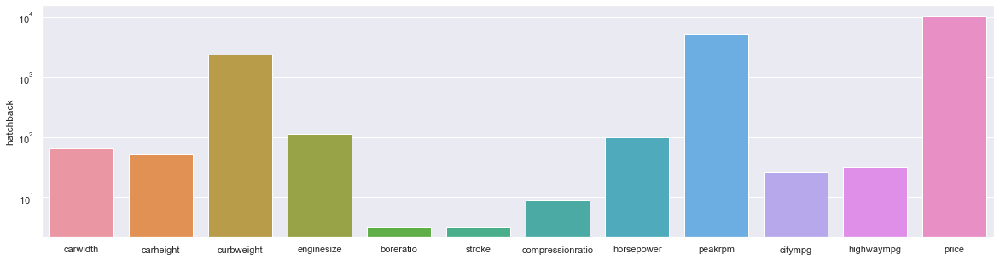

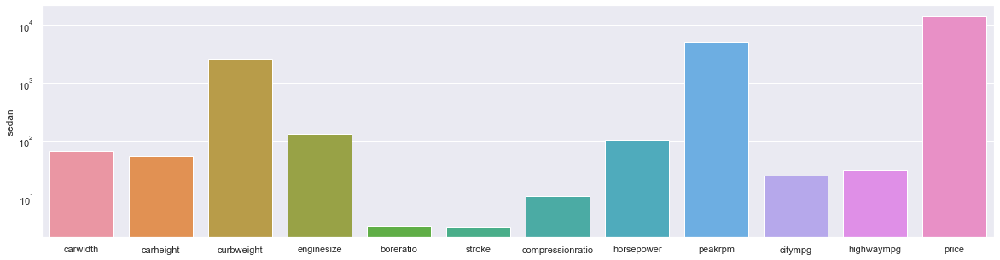

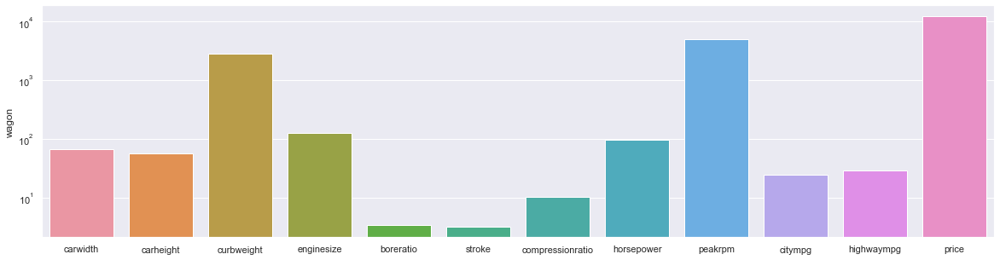

In [270]:
plt.figure(figsize=(20,5))
sns.barplot(data=carbody_grouped, y="convertible", x=carbody_grouped.index)
plt.yscale("log")

sns.barplot(data=carbody_grouped, y="hardtop", x=carbody_grouped.index)
plt.yscale("log")

plt.figure(figsize=(20,5))
sns.barplot(data=carbody_grouped, y="hatchback", x=carbody_grouped.index)
plt.yscale("log")

plt.figure(figsize=(20,5))
sns.barplot(data=carbody_grouped, y="sedan", x=carbody_grouped.index)
plt.yscale("log")

plt.figure(figsize=(20,5))
sns.barplot(data=carbody_grouped, y="wagon", x=carbody_grouped.index)
plt.yscale("log")

<h1>Feature Engineering</h1>

In [136]:
df.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [138]:
# Analyze each column in detail and drop unuseful ones
df.drop(["car_ID", "symboling"], axis=1, inplace=True)

In [163]:
# Identifying the string columns with less than 10 unique values, so we can One-Hot Encode them. 
for i in df.columns:
    if (len(df[i].value_counts().index) < 10) & (df[i].dtype == "O"):
        print(df[i].value_counts())
        print("\n")
    elif (len(df[i].value_counts().index) > 10) & (df[i].dtype == "O"):
        print(f"Column {i} has {len(df[i].value_counts().index)} unique values.")
        print("\n")
    else:
        pass

Column CarName has 22 unique values.


gas       185
diesel     20
Name: fueltype, dtype: int64


std      168
turbo     37
Name: aspiration, dtype: int64


four    115
two      90
Name: doornumber, dtype: int64


sedan          96
hatchback      70
wagon          25
hardtop         8
convertible     6
Name: carbody, dtype: int64


fwd    120
rwd     76
4wd      9
Name: drivewheel, dtype: int64


front    202
rear       3
Name: enginelocation, dtype: int64


ohc      148
ohcf      15
ohcv      13
l         12
dohc      12
rotor      4
dohcv      1
Name: enginetype, dtype: int64


four      159
six        24
five       11
eight       5
two         4
three       1
twelve      1
Name: cylindernumber, dtype: int64


mpfi    94
2bbl    66
idi     20
1bbl    11
spdi     9
4bbl     3
spfi     1
mfi      1
Name: fuelsystem, dtype: int64




In [160]:
# Extract only the brand names 
df["CarName"] = df["CarName"].apply(lambda x: x.split(" ")[0]).replace({
    "toyouta": "toyota",
    "Nissan": "nissan",
    "vokswagen": "volkswagen",
    "porcshce": "porsche",
    "maxda": "mazda",
    "vw": "volkswagen"
})

In [174]:
object_columns = [i for i in df.columns if df[i].dtype == "O"]
ready_data = pd.get_dummies(data=df, columns=object_columns, drop_first=True)
ready_data.head()

,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,...,cylindernumber_three,cylindernumber_twelve,cylindernumber_two,fuelsystem_2bbl,fuelsystem_4bbl,fuelsystem_idi,fuelsystem_mfi,fuelsystem_mpfi,fuelsystem_spdi,fuelsystem_spfi
0,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,9.0,111,...,0,0,0,0,0,0,0,1,0,0
1,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,9.0,111,...,0,0,0,0,0,0,0,1,0,0
2,94.5,171.2,65.5,52.4,2823,152,2.68,3.47,9.0,154,...,0,0,0,0,0,0,0,1,0,0
3,99.8,176.6,66.2,54.3,2337,109,3.19,3.40,10.0,102,...,0,0,0,0,0,0,0,1,0,0
4,99.4,176.6,66.4,54.3,2824,136,3.19,3.40,8.0,115,...,0,0,0,0,0,0,0,1,0,0


<h3>MODEL SELECTION</h3>

In [178]:
# Splitting data to training and test sets
X = ready_data.drop("price", axis=1)
y = ready_data["price"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [181]:
# Scaling the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test) 

In [207]:
# Defining a Funtion for Multi Linear Regression
def linear_model(train_X, test_X, train_y, test_y):
    model = LinearRegression().fit(train_X, train_y)
    predictions = model.predict(test_X)
    print(f'Mean Absolute Error: {mean_absolute_error(test_y, predictions)}')
    print(f'Root Mean Squared Error: {np.sqrt((mean_squared_error(test_y, predictions)))}')


# Defining a Function for KNearestRegressor
def kneighbors_model(n_count, train_X, test_X, train_y, test_y):
    model = KNeighborsRegressor(n_neighbors=n_count).fit(train_X, train_y)
    predictions = model.predict(test_X)
    print(f'Mean Absolute Error: {mean_absolute_error(test_y, predictions)}')
    print(f'Root Mean Squared Error: {np.sqrt((mean_squared_error(test_y, predictions)))}')


# Defining a Function for Decision Tree Regressor 
def decision_tree_model(maximum_depth, train_X, test_X, train_y, test_y):
    model = DecisionTreeRegressor(max_depth=maximum_depth).fit(train_X, train_y)
    predictions = model.predict(test_X)
    print(f'Mean Absolute Error: {mean_absolute_error(test_y, predictions)}')
    print(f'Root Mean Squared Error: {np.sqrt((mean_squared_error(test_y, predictions)))}')


# Defining a Function for Random Forest Regressor 
def random_forest_model(estimator_number, train_X, test_X, train_y, test_y):
    model = RandomForestRegressor(n_estimators=estimator_number, max_depth=estimator_number).fit(train_X, train_y)
    predictions = model.predict(test_X)
    print(f'Mean Absolute Error: {mean_absolute_error(test_y, predictions)}')
    print(f'Root Mean Squared Error: {np.sqrt((mean_squared_error(test_y, predictions)))}')


# Defining a Function for 
def svmr_model(train_X, test_X, train_y, test_y):
    model = SVR().fit(train_X, train_y)
    predictions = model.predict(test_X)
    print(f'Mean Absolute Error: {mean_absolute_error(test_y, predictions)}')
    print(f'Root Mean Squared Error: {np.sqrt((mean_squared_error(test_y, predictions)))}')

<h5>Multi Linear Regression</h5>

In [198]:
linear_model(train_X=X_train, train_y=y_train, test_X=X_test, test_y=y_test)

Mean Absolute Error: 1937.209649567581
Root Mean Squared Error: 3203.3690483580162


<h5>KNearest Neighbors Classifier</h5>

In [205]:
for i in range(2, 12):
    print(f'N Count: {i}')
    kneighbors_model(n_count=i, train_X=X_train, test_X=X_test, train_y=y_train, test_y=y_test)
    print("\n")
# n_count = 2 gives the smallest error

N Count: 2
Mean Absolute Error: 2103.4569838709676
Root Mean Squared Error: 3218.1427367873102


N Count: 3
Mean Absolute Error: 2267.072575268817
Root Mean Squared Error: 3615.444504797028


N Count: 4
Mean Absolute Error: 2415.0295645161286
Root Mean Squared Error: 3773.946921352193


N Count: 5
Mean Absolute Error: 2327.9876290322577
Root Mean Squared Error: 3975.6634407595116


N Count: 6
Mean Absolute Error: 2429.9005430107527
Root Mean Squared Error: 4237.85676391294


N Count: 7
Mean Absolute Error: 2528.942785714286
Root Mean Squared Error: 4455.058740122911


N Count: 8
Mean Absolute Error: 2591.2305161290324
Root Mean Squared Error: 4683.491035913712


N Count: 9
Mean Absolute Error: 2674.5009014336915
Root Mean Squared Error: 4885.265882319365


N Count: 10
Mean Absolute Error: 2730.0252741935487
Root Mean Squared Error: 5003.295929173619


N Count: 11
Mean Absolute Error: 2801.026153958944
Root Mean Squared Error: 5180.23415818247




<h5>Decision Tree Regressor</h5>

In [204]:
for i in range(50, 500, 50):
    print(f'Maximum Depth: {i}')
    decision_tree_model(maximum_depth=i, train_X=X_train, test_X=X_test, train_y=y_train, test_y=y_test)
    print("\n")
    
# Maximum Depth = 300 gives the smallest error

Maximum Depth: 50
Mean Absolute Error: 1854.4166612903225
Root Mean Squared Error: 2640.94373003743


Maximum Depth: 100
Mean Absolute Error: 1790.9166612903225
Root Mean Squared Error: 2574.186535098434


Maximum Depth: 150
Mean Absolute Error: 1917.287629032258
Root Mean Squared Error: 2764.5230665024333


Maximum Depth: 200
Mean Absolute Error: 2029.029564516129
Root Mean Squared Error: 3061.7498651648407


Maximum Depth: 250
Mean Absolute Error: 2012.755370967742
Root Mean Squared Error: 3087.61977352607


Maximum Depth: 300
Mean Absolute Error: 1637.755370967742
Root Mean Squared Error: 2338.22145652206


Maximum Depth: 350
Mean Absolute Error: 1954.8682741935484
Root Mean Squared Error: 2926.808690707032


Maximum Depth: 400
Mean Absolute Error: 1789.4489193548386
Root Mean Squared Error: 2607.2286444765164


Maximum Depth: 450
Mean Absolute Error: 1947.0779516129032
Root Mean Squared Error: 2884.172586900872




<h5>Random Forest Model</h5>

In [209]:
for i in range(50, 550, 50):
    print(f'Estimator Number: {i}')
    print(f'Max Depth: {i}')
    random_forest_model(estimator_number=i, train_X=X_train, test_X=X_test, train_y=y_train, test_y=y_test)
    print("\n")

# Estimator Number = 450 has the smallest error

Estimator Number: 50
Max Depth: 50
Mean Absolute Error: 1549.2553709677422
Root Mean Squared Error: 2438.7337436389753


Estimator Number: 100
Max Depth: 100
Mean Absolute Error: 1571.5762849462362
Root Mean Squared Error: 2315.2055242641595


Estimator Number: 150
Max Depth: 150
Mean Absolute Error: 1626.9376469534047
Root Mean Squared Error: 2418.059730191987


Estimator Number: 200
Max Depth: 200
Mean Absolute Error: 1585.4184489247311
Root Mean Squared Error: 2393.2197241758217


Estimator Number: 250
Max Depth: 250
Mean Absolute Error: 1591.5073110599083
Root Mean Squared Error: 2378.9570783542435


Estimator Number: 300
Max Depth: 300
Mean Absolute Error: 1571.5905501792115
Root Mean Squared Error: 2360.068530989398


Estimator Number: 350
Max Depth: 350
Mean Absolute Error: 1594.1922987711212
Root Mean Squared Error: 2362.8321989638343


Estimator Number: 400
Max Depth: 400
Mean Absolute Error: 1588.425055107527
Root Mean Squared Error: 2361.175261305583


Estimator Number: 450


In [210]:
svmr_model(train_X=X_train, test_X=X_test, train_y=y_train, test_y=y_test)

Mean Absolute Error: 5459.644654606659
Root Mean Squared Error: 8369.821967342972


<h5>Explore Linear Regression and Random Forest Models More in Detail</h5>

In [220]:
# Building Linear Model
linear_model = LinearRegression().fit(X_train, y_train)
predictions_l = linear_model.predict(X_test)
results_l = pd.DataFrame(y_test)
results_l["predicted_prices"] = predictions_l
results_l["residuals"] = results_l["price"] - results_l["predicted_prices"]
results_l.head()

,price,predicted_prices,residuals
120,6229.0,6613.663828,-384.663828
185,8195.0,9148.180113,-953.180113
180,15690.0,18372.450926,-2682.450926
119,7957.0,7833.864768,123.135232
109,12440.0,13996.395725,-1556.395725


<Figure size 864x432 with 0 Axes>

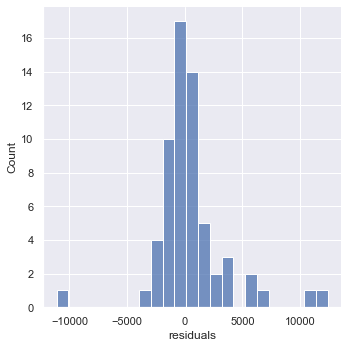

In [224]:
plt.figure(figsize=(12,6))
sns.displot(results_l["residuals"])

<AxesSubplot:xlabel='price', ylabel='predicted_prices'>

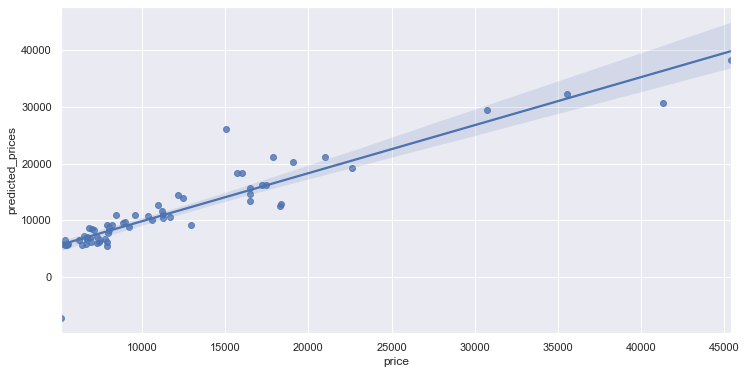

In [249]:
plt.figure(figsize=(12,6))
sns.regplot(x=results_l["price"], y=results_l["predicted_prices"])

In [253]:
# T TEST
p_value_t_test =  ttest_ind_from_stats(
    mean1=np.mean(results_l["price"]),
    std1=np.sqrt(np.var(results_l["price"])),
    nobs1=len(results_l["price"]),
    mean2=np.mean(results_l["predicted_prices"]),
    std2=np.sqrt(np.var(results_l["predicted_prices"])),
    nobs2=len(results_l["price"])
).pvalue

if p_value_t_test > 0.05:
    print("At 5% significance level we fail to reject to Null Hypothesis.")
else:
    print("At 5% significance level we reject to Null Hypothesis.")

At 5% significance level we fail to reject to Null Hypothesis.


In [257]:
# Random Forest Model
rf_model = RandomForestRegressor(n_estimators=50, max_depth=50).fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)
rf_results = pd.DataFrame(y_test)
rf_results["predicted_prices"] = rf_predictions
rf_results["residuals"] = rf_results["price"] - rf_results["predicted_prices"]
rf_results

,price,predicted_prices,residuals
120,6229.000,6286.84,-57.840
185,8195.000,8229.98,-34.980
180,15690.000,17243.56,-1553.560
119,7957.000,7902.76,54.240
109,12440.000,15724.68,-3284.680
...,...,...,...
170,11199.000,11049.14,149.860
177,11248.000,10436.16,811.840
9,17859.167,19271.14,-1411.973
159,7788.000,8230.05,-442.050


<Figure size 864x432 with 0 Axes>

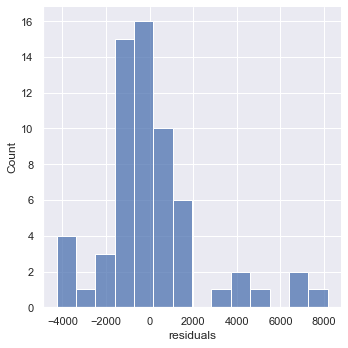

In [258]:
plt.figure(figsize=(12,6))
sns.displot(x=rf_results["residuals"])

<AxesSubplot:xlabel='price', ylabel='predicted_prices'>

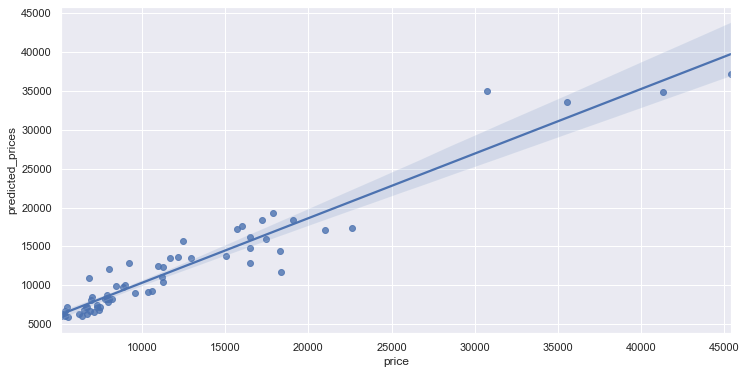

In [272]:
plt.figure(figsize=(12,6))
sns.regplot(x=rf_results["price"], y=rf_results["predicted_prices"])

In [274]:
p_value_t_test_rfmodel =  ttest_ind_from_stats(
    mean1=np.mean(rf_results["price"]),
    std1=np.sqrt(np.var(rf_results["price"])),
    nobs1=len(rf_results["price"]),
    mean2=np.mean(rf_results["predicted_prices"]),
    std2=np.sqrt(np.var(rf_results["predicted_prices"])),
    nobs2=len(rf_results["price"])
).pvalue

if p_value_t_test_rfmodel > 0.05:
    print("At 5% significance level we fail to reject to Null Hypothesis.")
else:
    print("At 5% significance level we reject to Null Hypothesis.")

At 5% significance level we fail to reject to Null Hypothesis.
